# Benchmark

In [1]:
%load_ext autoreload
%autoreload 2


In [2]:
import os
import numpy as np
import scanpy as sc
import time
from pathlib import Path
import torch
import concord as ccd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib as mpl

from matplotlib import font_manager, rcParams
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['pdf.fonttype'] = 42

/wynton/group/gartner/zuzhi/.conda/envs/scenv/lib/python3.13/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [5]:
proj_name = "dkd_Wilson"
save_dir = f"../save/{proj_name}-{time.strftime('%b%d')}/"
save_dir = Path(save_dir)
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = f"../data/"
data_dir = Path(data_dir)
data_dir.mkdir(parents=True, exist_ok=True)

device = torch.device('cuda:3' if torch.cuda.is_available() else 'cpu')
print(device)
seed = 0
ccd.ul.set_seed(seed)

file_suffix = f"{time.strftime('%b%d-%H%M')}"
file_suffix

cpu


'Jun11-1533'

In [6]:
# load the adata
adata = sc.read_h5ad(data_dir / "dkd_Wilson.h5ad")

In [7]:
adata

AnnData object with n_obs × n_vars = 39176 × 36398
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type'
    uns: 'citation', 'default_embedding', 'schema_reference', 'schema_version', 'title'


In [ ]:
# # save the raw counts to adata.layers
# adata.layers["counts"] = adata.raw.X.copy()

In [8]:
batch_key = 'donor_id'
state_key = 'cell_type'

## preprocess data

In [9]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, flavor="seurat_v3", batch_key=batch_key)
sc.tl.pca(adata, n_comps=30, use_highly_variable=True)

In [10]:
adata = adata[:, adata.var.highly_variable].copy()

----

In [12]:
adata

AnnData object with n_obs × n_vars = 39176 × 2000
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid'
    var: 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length', 'feature_type', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'high

In [13]:
combined_keys = [
        "unintegrated",
        "scanorama", "liger", "harmony",
        "scvi", "scanvi",
        "concord",
        "concord_class", 
        "concord_decoder", "contrastive"
    ]

In [14]:
time_log, ram_log, vram_log = ccd.ul.run_integration_methods_pipeline(
    adata=adata,                          # Your input AnnData object
    methods=combined_keys,            # List of methods to run
    batch_key=batch_key,                    # Column in adata.obs for batch info
    count_layer="counts",                 # Layer name containing raw counts
    class_key=state_key,               # Column in adata.obs for class labels (used in SCANVI and CONCORD variants)
    latent_dim=30,                        # Latent dimensionality for PCA and embeddings
    device='cpu',                        # Or "cpu", or "mps" for Apple Silicon
    return_corrected=False,                   # Whether to store corrected expression matrices
    transform_batch=None,                 # Optionally specify a batch to transform to in scVI
    seed=42,                              # Random seed for reproducibility
    compute_umap=True,                    # Run UMAP for all output embeddings
    umap_n_components=2,
    umap_n_neighbors=30,
    umap_min_dist=0.5,
    verbose=True,                        # Print progress messages
)

Concord - WARNING - save_dir is None. Model and log files will not be saved.
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


FAISS not found. Using sklearn for k-NN computation.


p_intra_knn: 0.3


Epoch 0 Training: 606it [00:17, 34.52it/s, loss=3.52]
Epoch 9 Training: 100%|██████████| 606/606 [00:17<00:00, 35.51it/s, loss=3.49]

Concord - WARNING - save_dir is None. Skipping model/config saving.



concord completed in 195.69 sec.
Running UMAP on concord...


Concord - WARNING - save_dir is None. Model and log files will not be saved.
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


FAISS not found. Using sklearn for k-NN computation.


p_intra_knn: 0.3


Epoch 0 Training: 606it [00:18, 32.88it/s, loss=3.77]
Epoch 9 Training: 100%|██████████| 606/606 [00:18<00:00, 33.58it/s, loss=3.67]


Concord - WARNING - save_dir is None. Skipping model/config saving.


concord_class completed in 185.56 sec.
Running UMAP on concord_class...


Concord - WARNING - save_dir is None. Model and log files will not be saved.
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.


FAISS not found. Using sklearn for k-NN computation.


p_intra_knn: 0.3


Epoch 0 Training: 606it [00:25, 23.53it/s, loss=3.52]
Epoch 9 Training: 100%|██████████| 606/606 [00:30<00:00, 20.01it/s, loss=3.58]

Concord - WARNING - save_dir is None. Skipping model/config saving.



concord_decoder completed in 287.59 sec.
Running UMAP on concord_decoder...


Concord - WARNING - save_dir is None. Model and log files will not be saved.
Concord - WARNING - No input feature list provided. It is recommended to first select features using the command `concord.ul.select_features()`.
Concord - WARNING - domain/batch information not found, all samples will be treated as from single domain/batch.


FAISS not found. Using sklearn for k-NN computation.
You specified p_intra_domain as 0.95 but you only have one domain. Resetting p_intra_domain to 1.0.


p_intra_knn: 0.3


Epoch 0 Training: 612it [00:20, 30.55it/s, loss=3.48]
Epoch 9 Training: 100%|██████████| 612/612 [00:16<00:00, 36.83it/s, loss=3.42]

Concord - WARNING - save_dir is None. Skipping model/config saving.



contrastive completed in 194.52 sec.
Running UMAP on contrastive...
Running UMAP on unintegrated...


Found 2000 genes among all datasets
[[0.         0.44882108 0.31733703 0.60013351 0.17614424 0.14785021
  0.28826729 0.31334842 0.53758669 0.07239945 0.03134535]
 [0.         0.         0.57327586 0.30721003 0.32941653 0.32170846
  0.36324786 0.21266968 0.51724138 0.22702278 0.06152038]
 [0.         0.         0.         0.25500668 0.70299838 0.53691535
  0.35897436 0.72511312 0.1756137  0.75883739 0.1441834 ]
 [0.         0.         0.         0.         0.38857374 0.15720961
  0.46192696 0.32466063 0.39319092 0.1738675  0.07743658]
 [0.         0.         0.         0.         0.         0.46191248
  0.48338736 0.5938914  0.2649919  0.46636953 0.21920583]
 [0.         0.         0.         0.         0.         0.
  0.26728827 0.46493213 0.45767298 0.35480492 0.13567839]
 [0.         0.         0.         0.         0.         0.
  0.         0.63461538 0.39121989 0.31468531 0.40792541]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.36312217 0.3

scanorama completed in 177.68 sec.
Running UMAP on scanorama...
100%|██████████| 30/30 [07:37<00:00, 15.24s/it]
liger completed in 578.50 sec.
Running UMAP on liger...


	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).


harmony completed in 320.81 sec.
Running UMAP on harmony...


	Completed 3 / 10 iteration(s).
Reach convergence after 3 iteration(s).


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Epoch 204/204: 100%|██████████| 204/204 [2:28:49<00:00, 39.58s/it, v_num=1, train_loss_step=502, train_loss_epoch=554]  

`Trainer.fit` stopped: `max_epochs=204` reached.


Epoch 204/204: 100%|██████████| 204/204 [2:28:49<00:00, 43.77s/it, v_num=1, train_loss_step=502, train_loss_epoch=554]


scvi completed in 8970.89 sec.
Running UMAP on scvi...


INFO     Training for 20 epochs.                                                                                   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Epoch 20/20: 100%|██████████| 20/20 [22:43<00:00, 64.20s/it, v_num=1, train_loss_step=509, train_loss_epoch=537]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [22:43<00:00, 68.19s/it, v_num=1, train_loss_step=509, train_loss_epoch=537]


scanvi completed in 1367.26 sec.
Running UMAP on scanvi...
✅ Selected methods completed.


In [15]:
adata

AnnData object with n_obs × n_vars = 39176 × 2000
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'concord_class_class_true', 'concord_class_class_pred', 'class_prob_fibroblast', 'class_prob_endothelial cell', 'class_prob_mesangial cell', 'class_prob_podocyte', 'class_prob_leukocyte', 'class_prob_renal bet

In [ ]:
# save the adata object and overwrite the existing file
# adata.write_h5ad(data_dir / "dkd_Wilson.h5ad", )

In [16]:
file_suffix

'Jun11-1533'

In [ ]:
# save the adata object
# adata.write_h5ad(data_dir / f"dkd_Wilson_processed_{file_suffix}.h5ad", )

In [ ]:
# print the logs
# run sequentially in a job, as a reference for time and memory usage
# better quantification neeed to be done by submitting each method separately
print("Time Log:")
for method, time_taken in time_log.items():
    print(f"{method}: {time_taken:.2f} seconds")
print("\nRAM Log:")
for method, ram_used in ram_log.items():
    print(f"{method}: {ram_used:.2f} MB")
print("\nVRAM Log:")
for method, vram_used in vram_log.items():
    print(f"{method}: {vram_used:.2f} MB")

Time Log:
concord: 195.69 seconds
concord_class: 185.56 seconds
concord_decoder: 287.59 seconds
contrastive: 194.52 seconds
scanorama: 177.68 seconds
liger: 578.50 seconds
harmony: 320.81 seconds
scvi: 8970.89 seconds
scanvi: 1367.26 seconds

RAM Log:
concord: 267.49 MB
concord_class: 1390.10 MB
concord_decoder: 1347.32 MB
contrastive: 1260.26 MB
scanorama: 0.00 MB
liger: 0.00 MB
harmony: 213.53 MB
scvi: 0.00 MB
scanvi: 0.00 MB

VRAM Log:
concord: 0.00 MB
concord_class: 0.00 MB
concord_decoder: 0.00 MB
contrastive: 0.00 MB
scanorama: 0.00 MB
liger: 0.00 MB
harmony: 0.00 MB
scvi: 0.00 MB
scanvi: 0.00 MB


In [23]:
# show the shape of obsm, not ending with _UMAP
print("Shape of obsm (excluding _UMAP):")   
for key, value in adata.obsm.items():
    if not key.endswith('_UMAP'):
        print(f"{key}: {value.shape}")

Shape of obsm (excluding _UMAP):
X_harmony: (39176, 50)
X_pca: (39176, 30)
X_umap: (39176, 2)
concord: (39176, 30)
concord_class: (39176, 30)
concord_decoder: (39176, 30)
contrastive: (39176, 30)
unintegrated: (39176, 30)
scanorama: (39176, 30)
liger: (39176, 30)
harmony: (39176, 30)
scvi: (39176, 30)
scanvi: (39176, 30)


In [24]:
adata

AnnData object with n_obs × n_vars = 39176 × 2000
    obs: 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'suspension_uuid', 'suspension_type', 'library_uuid', 'assay_ontology_term_id', 'mapped_reference_annotation', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'reported_diseases', 'sex_ontology_term_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.rpl', 'percent.rps', 'doublet_id', 'nCount_SCT', 'nFeature_SCT', 'seurat_clusters', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'concord_class_class_true', 'concord_class_class_pred', 'class_prob_fibroblast', 'class_prob_endothelial cell', 'class_prob_mesangial cell', 'class_prob_podocyte', 'class_prob_leukocyte', 'class_prob_renal bet

In [26]:
adata.obs.columns.tolist()

['donor_id',
 'self_reported_ethnicity_ontology_term_id',
 'organism_ontology_term_id',
 'sample_uuid',
 'sample_preservation_method',
 'tissue_ontology_term_id',
 'development_stage_ontology_term_id',
 'suspension_uuid',
 'suspension_type',
 'library_uuid',
 'assay_ontology_term_id',
 'mapped_reference_annotation',
 'is_primary_data',
 'cell_type_ontology_term_id',
 'author_cell_type',
 'disease_ontology_term_id',
 'reported_diseases',
 'sex_ontology_term_id',
 'nCount_RNA',
 'nFeature_RNA',
 'percent.mt',
 'percent.rpl',
 'percent.rps',
 'doublet_id',
 'nCount_SCT',
 'nFeature_SCT',
 'seurat_clusters',
 'tissue_type',
 'cell_type',
 'assay',
 'disease',
 'organism',
 'sex',
 'tissue',
 'self_reported_ethnicity',
 'development_stage',
 'observation_joinid',
 'concord_class_class_true',
 'concord_class_class_pred',
 'class_prob_fibroblast',
 'class_prob_endothelial cell',
 'class_prob_mesangial cell',
 'class_prob_podocyte',
 'class_prob_leukocyte',
 'class_prob_renal beta-intercalated

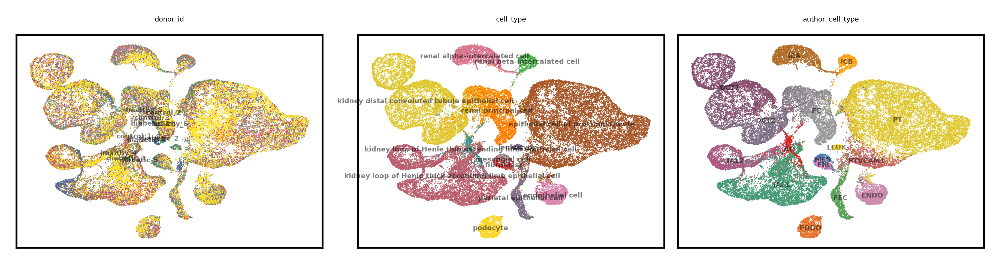

In [28]:
show_emb = 'concord_UMAP'
# 'unintegrated_UMAP', 'scanorama_UMAP', 'liger_UMAP', 'harmony_UMAP', 'scvi_UMAP',

show_cols = ['donor_id', 'cell_type', 'author_cell_type']

ccd.pl.plot_embedding(
    adata, show_emb, show_cols, 
    figsize=(6,1.5), dpi=600, ncols=len(show_cols), font_size=3, point_size=1, legend_loc='on data',
    # save_path=save_dir / f"embeddings_{show_emb}_{file_suffix}.pdf"
)

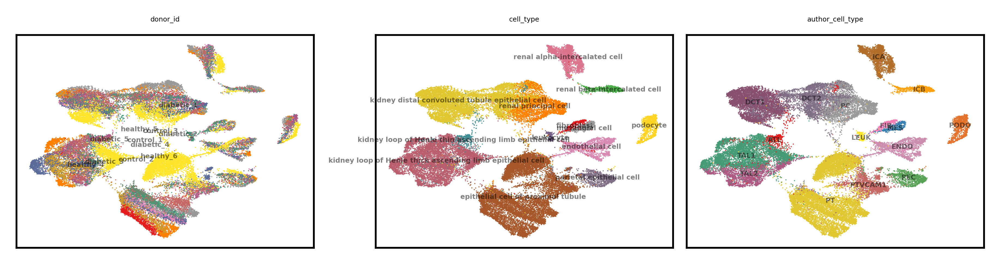

In [ ]:
show_emb = 'unintegrated_UMAP'
# 'concord_UMAP'
# 'scanorama_UMAP', 'liger_UMAP', 'harmony_UMAP', 'scvi_UMAP',

show_cols = ['donor_id', 'cell_type', 'author_cell_type']

ccd.pl.plot_embedding(
    adata, show_emb, show_cols, 
    figsize=(6,1.5), dpi=600, ncols=len(show_cols), font_size=3, point_size=1, legend_loc='on data',
    # save_path=save_dir / f"embeddings_{show_emb}_{file_suffix}.pdf"
)

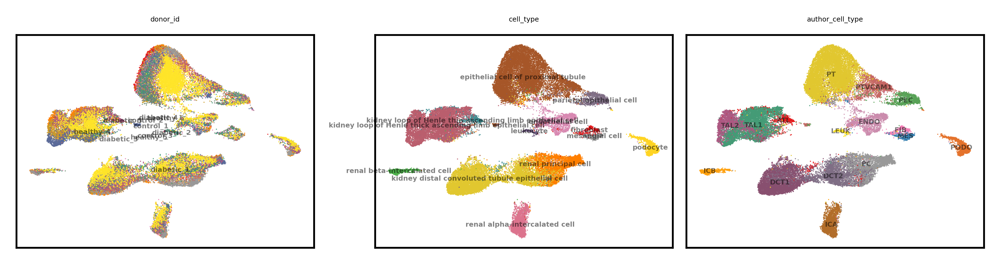

In [30]:
show_emb = 'scanorama_UMAP'
# 'concord_UMAP', 'unintegrated_UMAP'
# 'liger_UMAP', 'harmony_UMAP', 'scvi_UMAP',

show_cols = ['donor_id', 'cell_type', 'author_cell_type']

ccd.pl.plot_embedding(
    adata, show_emb, show_cols, 
    figsize=(6,1.5), dpi=600, ncols=len(show_cols), font_size=3, point_size=1, legend_loc='on data',
    # save_path=save_dir / f"embeddings_{show_emb}_{file_suffix}.pdf"
)

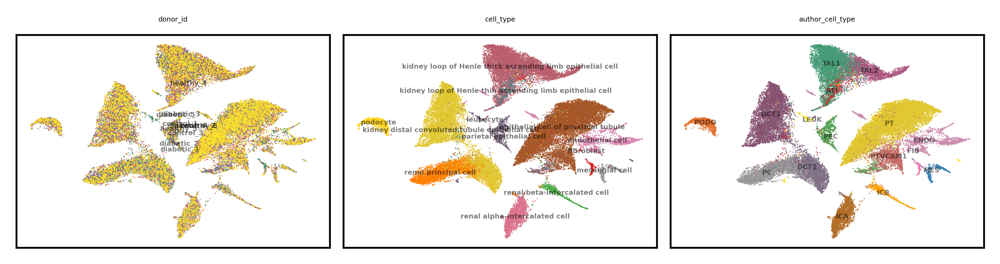

In [31]:
show_emb = 'liger_UMAP'
# 'concord_UMAP', 'unintegrated_UMAP', 'scanorama_UMAP'
# 'harmony_UMAP', 'scvi_UMAP',

show_cols = ['donor_id', 'cell_type', 'author_cell_type']

ccd.pl.plot_embedding(
    adata, show_emb, show_cols, 
    figsize=(6,1.5), dpi=600, ncols=len(show_cols), font_size=3, point_size=1, legend_loc='on data',
    # save_path=save_dir / f"embeddings_{show_emb}_{file_suffix}.pdf"
)

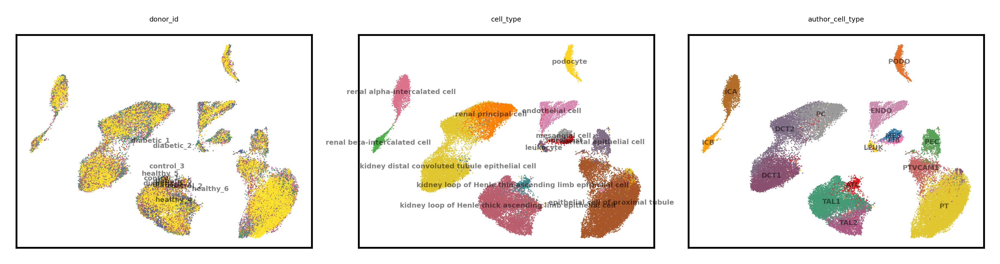

In [32]:
show_emb = 'harmony_UMAP'
# 'concord_UMAP', 'unintegrated_UMAP', 'scanorama_UMAP', 'liger_UMAP'
# 'scvi_UMAP',

show_cols = ['donor_id', 'cell_type', 'author_cell_type']

ccd.pl.plot_embedding(
    adata, show_emb, show_cols, 
    figsize=(6,1.5), dpi=600, ncols=len(show_cols), font_size=3, point_size=1, legend_loc='on data',
    # save_path=save_dir / f"embeddings_{show_emb}_{file_suffix}.pdf"
)

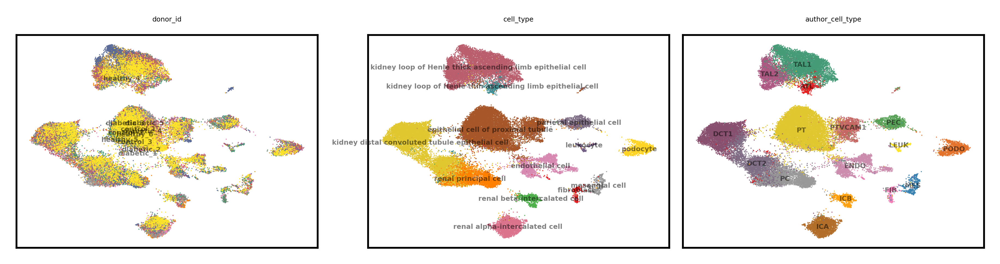

In [33]:
show_emb = 'scvi_UMAP'
# 'concord_UMAP', 'unintegrated_UMAP', 'scanorama_UMAP', 'liger_UMAP', 'harmony_UMAP'

show_cols = ['donor_id', 'cell_type', 'author_cell_type']

ccd.pl.plot_embedding(
    adata, show_emb, show_cols, 
    figsize=(6,1.5), dpi=600, ncols=len(show_cols), font_size=3, point_size=1, legend_loc='on data',
    # save_path=save_dir / f"embeddings_{show_emb}_{file_suffix}.pdf"
)